## **Загрузка необходимых библиотек и компонентов**

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import monai.transforms as transforms
from monai.data import DataLoader, Dataset, CacheDataset
from monai.utils import set_determinism
from glob import glob
import os
import numpy as np
%load_ext tensorboard

In [49]:
torch.backends.cudnn.benchmark = True

## **Настройка гипперпараметров**

In [36]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
LEARNING_RATE = 3e-4
Z_DIM = 100
CHANNELS_IMG = 1
IMAGE_SIZE = 128
BATCH_SIZE = 32 
NUM_EPOCHS = 50
FEATURES_DISC = 64
FEATURES_GEN = 64

## **Модель дескриминатора**

In [37]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        # Input: N*channels_img*128*128
        self.disc = nn.Sequential(
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),#64x64
            nn.LeakyReLU(0.2),
            self.block(features_d, features_d*2, 4, 2, 1),#32x32
            self.block(features_d*2, features_d*4, 4, 2, 1),#16x16
            self.block(features_d*4, features_d*8, 4, 2, 1),#8x8
            self.block(features_d*8, features_d*16, 4, 2, 1),#8x8
            nn.Conv2d(features_d*16, 1, kernel_size=4, stride=2, padding=0),#1x1
            nn.Sigmoid()#[0, 1]
        )

    def block(self, in_channels, out_channels, kernel_size, stride, padding):
          return nn.Sequential(
              nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias = False),
              nn.BatchNorm2d(out_channels),
              nn.LeakyReLU(0.2)
          )

    def forward(self, x):
        return self.disc(x)

## **Модель генератора**

In [38]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        #Input: N*z_dim*1*1
        self.gen = nn.Sequential(
            self.block(z_dim, features_g*32, 4, 1, 0),#4x4
            self.block(features_g*32, features_g*16, 4, 2, 1),#8x8
            self.block(features_g*16, features_g*8, 4, 2, 1),#16x16
            self.block(features_g*8, features_g*4, 4, 2, 1),#32x32
            self.block(features_g*4, features_g*2, 4, 2, 1),#64x64
            nn.ConvTranspose2d(features_g*2, channels_img, kernel_size=4, stride=2, padding=1),#128x128
            nn.Tanh()#[-1, 1]

        )

    def block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias = False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.gen(x)

## **Инициализация весов**

In [39]:
def initialize_weights(model):      
    for m  in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


## **Создание нейросетей**

In [40]:
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
initialize_weights(disc)
initialize_weights(gen)

In [41]:
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
loss = nn.BCELoss()

fixed_noise = torch.randn(16, Z_DIM, 1, 1).to(device)
writer_fake = SummaryWriter(f"logs_dcgan/fake")
writer_real = SummaryWriter(f"logs_dcgan/real")
step = 0

## **Загрузка и трансформация изображений**

In [52]:
#Параметры загрузки и трансформации изображений
IN_DIR = "../data/patients_dcm_test"
PIX_DIM=(1.5, 1.5, 1.0)
A_MIN=-200
A_MAX=200
SPARTIAL_SIZE=[128, 128, 1]
CACHE = False

set_determinism(seed=0)

In [53]:
def get_loader(in_dir = "../data/patients_dcm", pix_dim=(1.5, 1.5, 1), 
               a_min=-200, a_max=200, spartial_size = [128, 128, 1],
               batch_size = 32, cache = False):
    
    #Список трансофрмаций
    train_transforms = transforms.Compose(
          [
            transforms.LoadImaged(keys=["vol"],ensure_channel_first = True),
            transforms.Spacingd(keys=["vol"], pixdim=pix_dim, mode='bilinear'),
            transforms.Orientationd(keys="vol", axcodes="RAS"),
            transforms.ScaleIntensityRanged(keys=["vol"], a_min=a_min, a_max=a_max, b_min=0.0, b_max=1.0, clip=True), 
            transforms.Resized(keys=["vol"], spatial_size=spartial_size),
            transforms.Rotate90d(keys=["vol"]),
            transforms.ToTensord(keys=["vol"]),

          ]
      )

    #Получение путей файлов
    path_volumes = glob(in_dir + "\\patient_*\\*.dcm")
    train_files  = [{"vol": image_name} for image_name in zip(path_volumes)]

    #Инициализация датасета и загрузчика
    if cache:
        
        dataset = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0)

    else:
        dataset = Dataset(data=train_files, transform=train_transforms)

    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    return loader

In [54]:
loader = get_loader(IN_DIR, PIX_DIM, A_MIN, A_MAX, SPARTIAL_SIZE, BATCH_SIZE, CACHE)

## **Просмотр обработанных изображений**

In [10]:
import matplotlib.pyplot as plt
from monai.utils import first
%matplotlib inline 

In [15]:
#Получение батча из загрузчика
IMAGE_SIZE = 256
spartial_size = [256, 256, 1]
batch_size = 16
in_dir_test = "../data/patients_dcm_test"
loader_ex = get_loader(in_dir_test, PIX_DIM, A_MIN, A_MAX, SPARTIAL_SIZE, batch_size, CACHE)
view_train_patient = first(loader_ex)
print(view_train_patient["vol"].shape)
view_train_patient = view_train_patient["vol"]
view_train_patient = view_train_patient.reshape(batch_size, 1, IMAGE_SIZE, IMAGE_SIZE)
print(view_train_patient.shape)

Loading dataset: 100%|██████████| 640/640 [00:14<00:00, 44.54it/s]

torch.Size([16, 1, 256, 256, 1])
torch.Size([16, 1, 256, 256])


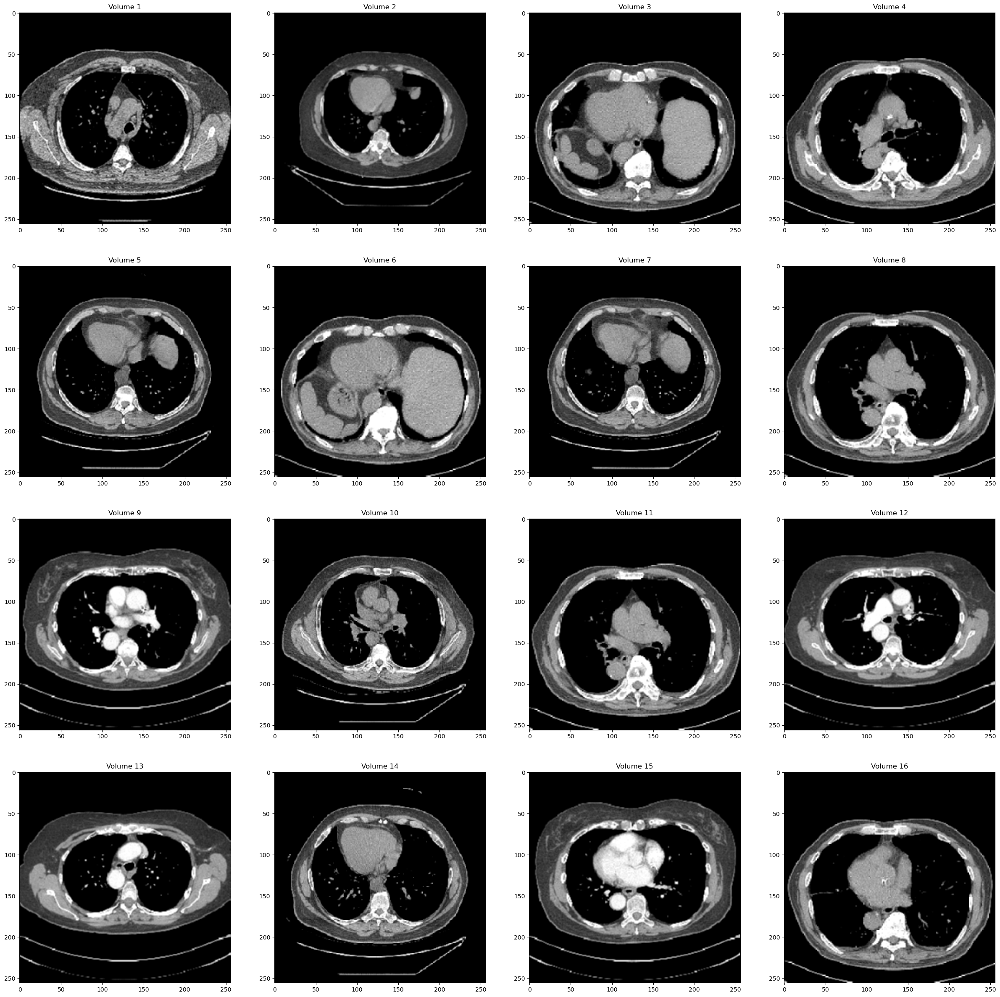

In [16]:
#Просмотр изображений
plt.figure("Visualization Train", (30, 30))

for i, image in enumerate(view_train_patient):    
      if i < 16:
        plt.subplot(4, 4, i+1)
        plt.title(f"Volume {i+1}")
        image = image[0, :, :]
        plt.imshow(image, cmap="gray")

## **Обучение нейросетей**

In [55]:
for epoch in tqdm(range(NUM_EPOCHS)):
    for batch_idx, batch_data in enumerate(loader):
        real = batch_data["vol"]
        real = real.reshape(BATCH_SIZE, 1, IMAGE_SIZE, IMAGE_SIZE) #Удаление последнего измерения
        real = torch.tensor(real)
        real = real.to(device)#Реальные изображения
        noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(device)#Сгенерипованный шум
        
        ### Тренировка деёскриминатора: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).view(-1)
        lossD_real = loss(disc_real, torch.ones_like(disc_real))
        fake = gen(noise)
        disc_fake = disc(fake).view(-1)
        lossD_fake = loss(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        disc.zero_grad()
        lossD.backward(retain_graph=True)
        opt_disc.step()

        ### Тренировка генератора: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).view(-1)
        lossG = loss(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()

    print(
        f"\tEpoch [{epoch}/{NUM_EPOCHS}] Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
    )
    
    with torch.no_grad():
        fake = gen(fixed_noise)
        img_grid_real = torchvision.utils.make_grid(real[:16], normalize=True)
        img_grid_fake = torchvision.utils.make_grid(fake[:16], normalize=True)

        writer_real.add_image(
            "Реальные изображения КТ грудной клетки", img_grid_real, global_step=step
        )
        writer_fake.add_image(
            "Сгенерированные изображения КТ грудной клетки", img_grid_fake, global_step=step
        )
        step += 1

  0%|          | 0/50 [00:00<?, ?it/s]


RuntimeError: Unable to find a valid cuDNN algorithm to run convolution

In [ ]:
torch.save(disc.state_dict(), "/content/drive/My Drive/УИРС/models/dcgan_monai(128x128)_disc")
torch.save(gen.state_dict(), "/content/drive/My Drive/УИРС/models/dcgan_monai(128x128)_gen")

##**Просмортр результата**

In [3]:
!kill 23076

kill: 23076: No such process


In [5]:
%reload_ext tensorboard
%tensorboard --logdir=cprogan_logs